# Keras Regression Code Along Project 

Let's now apply our knowledge to a more realistic data set. Here we will also focus on feature engineering and cleaning our data!

## The Data

We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [167]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score, explained_variance_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Buyuk sayilari e ile degil, normal gosterim yapar.
from matplotlib import style

#style.use('dark_background')
style.use('seaborn-ticks')
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [3]:
# Google Calab

# from google.colab import drive
# drive.mount('/content/drive')

# df = pd.read_csv('/content/drive/MyDrive/tensorflow/DATA/kc_house_data.csv')

In [4]:
# df = pd.read_csv('DATA/kc_house_data.csv')

df = pd.read_csv('../data/kc_house_data.csv')
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,...,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,...,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,...,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,...,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,...,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


# Exploratory Data Analysis

In [5]:
df.shape

(21597, 21)

In [6]:
df.isnull().sum().any()

False

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [8]:
df.nunique()

id               21420
date               372
price             3622
bedrooms            12
bathrooms           29
sqft_living       1034
sqft_lot          9776
floors               6
waterfront           2
view                 5
condition            5
grade               11
sqft_above         942
sqft_basement      306
yr_built           116
yr_renovated        70
zipcode             70
lat               5033
long               751
sqft_living15      777
sqft_lot15        8682
dtype: int64

In [9]:
# özellikle fazla feature olunca transpose ile ekrana sigar
df.describe().T 

# Alternative
# df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


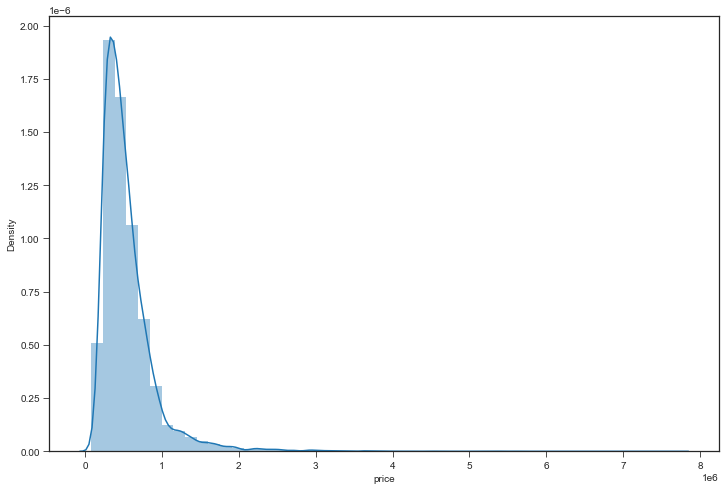

In [10]:
plt.figure(figsize=(12,8))
sns.distplot(df['price']);

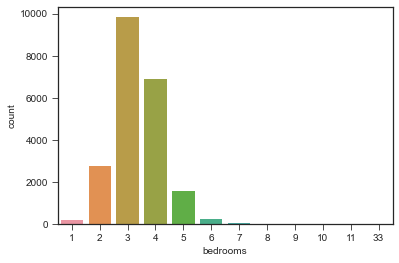

In [11]:
sns.countplot(df['bedrooms']);

In [12]:
df.bedrooms.value_counts().sort_index()

1      196
2     2760
3     9824
4     6882
5     1601
6      272
7       38
8       13
9        6
10       3
11       1
33       1
Name: bedrooms, dtype: int64

**11 ve 33 bedrooms olan 1'er adet observation var.Bu:**
* Otel/Pansiyon/Malikane olabilir
* Outlier bir ev olabilir
* Typo hatasi olabilir.

Diger features a bakarak buna karar vermeliyiz.

In [13]:
df.groupby(df.bedrooms).bathrooms.describe()

,count,mean,std,min,25%,50%,75%,max
bedrooms,,,,,,,,
1,196.000,1.083,0.341,0.500,1.000,1.000,1.000,2.500
2,2760.000,1.402,0.540,0.500,1.000,1.000,1.750,3.500
3,9824.000,1.968,0.630,0.750,1.500,2.000,2.500,4.500
4,6882.000,2.436,0.647,0.500,2.000,2.500,2.750,5.750
5,1601.000,2.779,0.836,1.000,2.250,2.750,3.250,6.750
6,272.000,3.068,1.065,1.000,2.500,3.000,3.750,8.000
7,38.000,3.651,1.386,1.000,2.750,3.500,4.250,8.000
8,13.000,3.558,1.011,2.500,2.750,3.250,4.000,6.000
9,6.000,4.417,1.656,3.000,3.250,4.250,4.500,7.500


* bathroom sayisina gore grupladigimizda typo hatasi oldugunu tespit ettik.

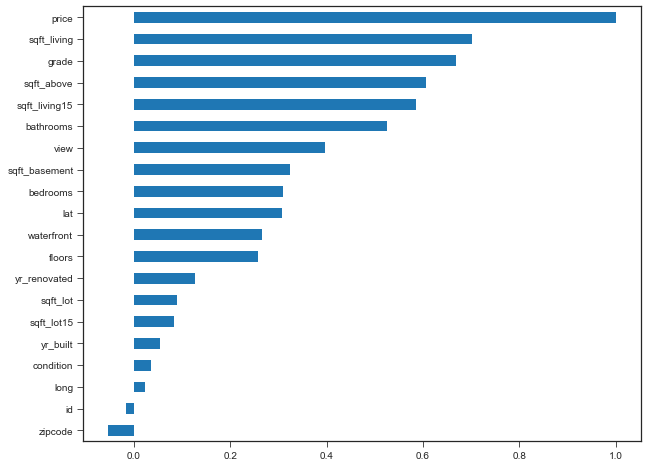

In [14]:
plt.figure(figsize=(10,8))
df.corr().price.sort_values().plot(kind='barh');

# Alternative
# df.corr()["price"].sort_values().plot.barh();

* target label ile en cok korrele feature a odaklanalim

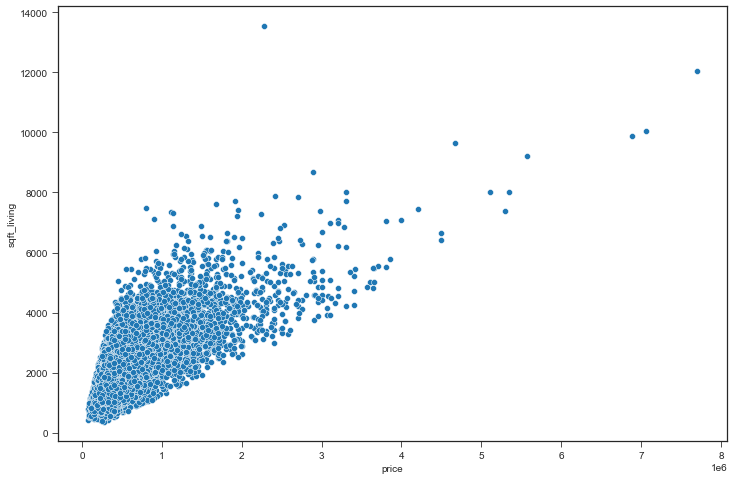

In [15]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='price',y='sqft_living',data=df);

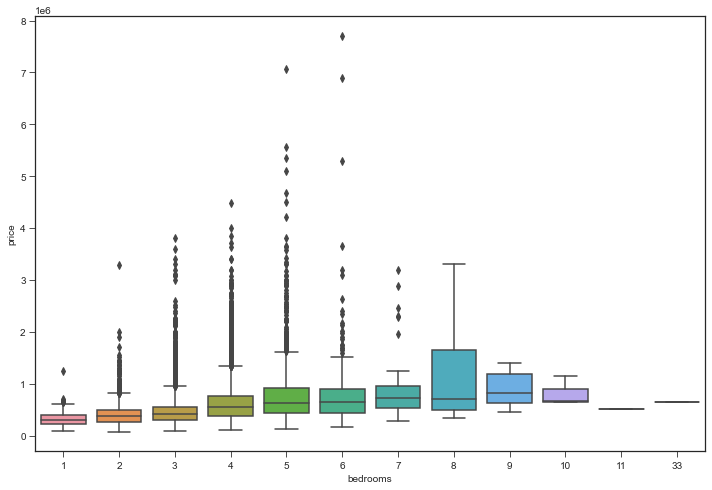

In [16]:
plt.figure(figsize=(12,8))
sns.boxplot(x='bedrooms',y='price',data=df);

### Geographical Properties

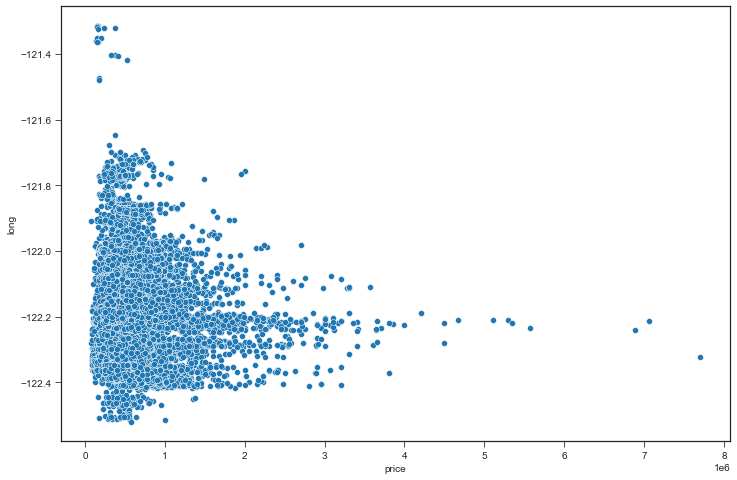

In [17]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='price',y='long',data=df);

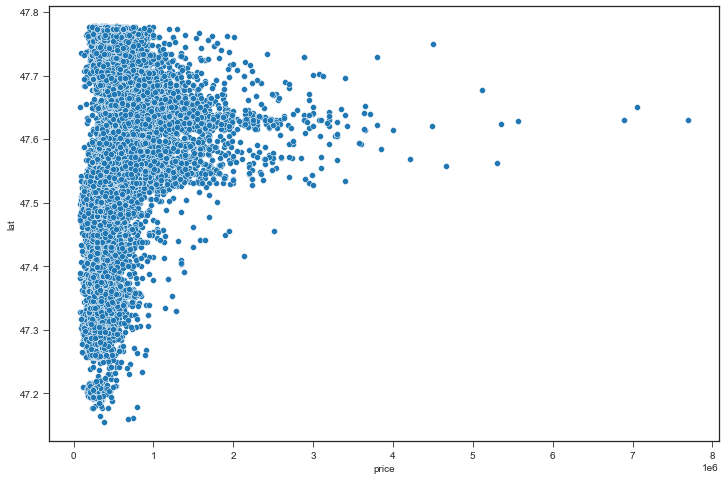

In [18]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='price',y='lat',data=df);

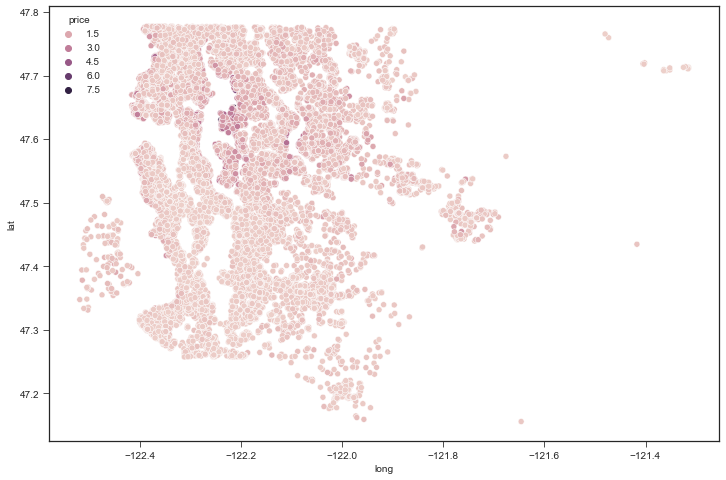

In [19]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='long',y='lat',data=df,hue='price');

In [20]:
# https://i.pinimg.com/originals/4a/ab/31/4aab31ce95d5b8474fd2cc063f334178.jpg
import folium
map_kc = folium.Map(location=[df["lat"].mean(),df["long"].mean()], zoom_start=8)

for lat, lng in zip(df['lat'], df['long']):
    folium.CircleMarker(
        [lat, lng],
        radius=0.1,
        color='blue',
        fill=False,
        fill_color='#3186CC',
        fill_opacity=0.1).add_to(map_kc)
map_kc

* Fiyatlar arasinda ucurum var. Bu nedenle Hue parametresi ile fiyat ayrimlari iyi gozlenemedi.
* Cozum olarak; fiyata gore siralama yapip en yuksek fiyatli %1 lik kismi dahil etmeden grafigi cizdirelim

In [21]:
df.sort_values('price',ascending=False).head(20)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,6762700020,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,...,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,9808700762,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,...,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9208900037,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,...,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,2470100110,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,...,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,8907500070,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,...,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,7558700030,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,...,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,1247600105,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,...,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,1924059029,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,...,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,7738500731,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,...,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,3835500195,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,...,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


**all palette colormaps:** https://user-images.githubusercontent.com/42834869/49302025-e5dbea00-f500-11e8-8ff8-cb5960afd781.JPEG

Yukaridan en uygun palette secilir.

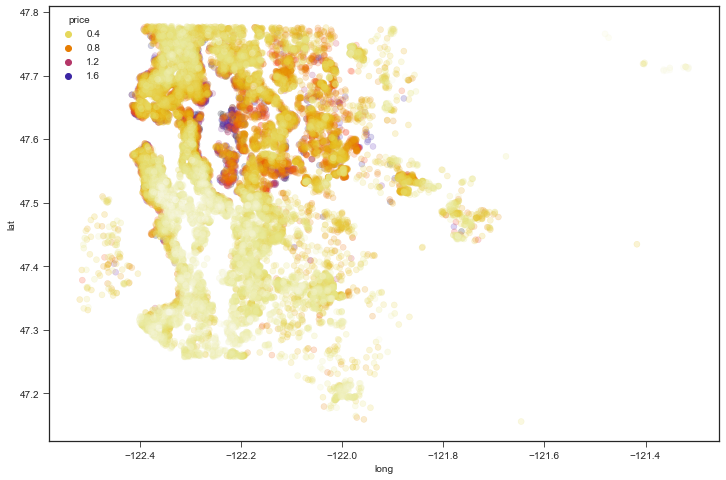

In [22]:
df2 = df.sort_values('price',ascending=False).iloc[round(len(df)*0.01):]

plt.figure(figsize=(12,8))
sns.scatterplot(x='long',
                y='lat',
                data=df2,
                hue='price',
                palette='CMRmap_r',
                edgecolor=None,
                alpha=0.2);

## Feature Engineering

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [24]:
df = df.drop('id',axis=1)
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


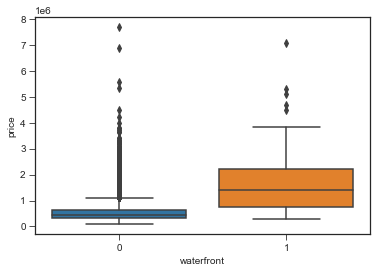

In [25]:
sns.boxplot(x='waterfront',y='price',data=df);

* Deniz manzarali olan evlerde fiyatlar daha yuksek ve kendi icinde dagilimi daha dengeli 

**Date**
* tarih verisi olmasina ragmen type i farkli olan features da type transformation yapalim
* tarih verisinden `feature engineering` yapmak analiz icin avantaj saglar.

In [28]:
df['date'] = pd.to_datetime(df['date'])
df['month'] = df['date'].apply(lambda date:date.month)
df['year'] = df['date'].apply(lambda date:date.year)

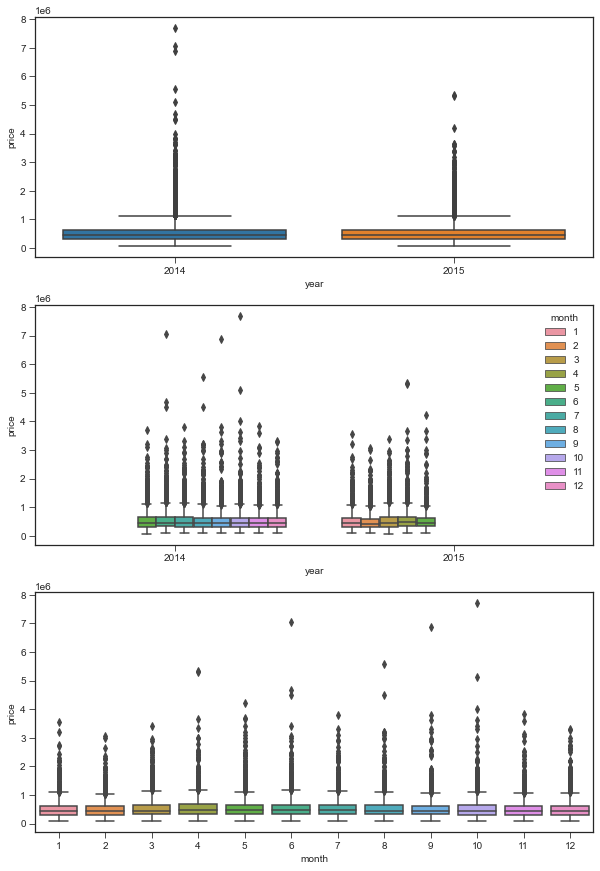

In [46]:
plt.figure(figsize=(10,15))

plt.subplot(311)
sns.boxplot(x='year',y='price', data=df)

plt.subplot(312)
sns.boxplot(x='year',y='price',hue='month',data=df)

plt.subplot(313)
sns.boxplot(x='month',y='price',data=df)
plt.show()

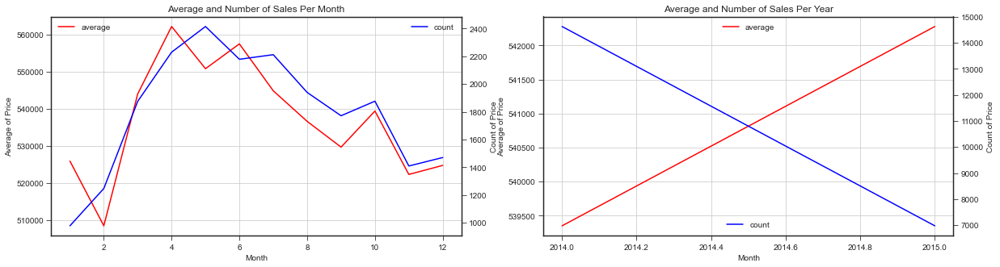

In [109]:
fig = plt.figure(figsize=(20,5))

fig.add_subplot(121)
ax = fig.add_subplot(121)
df.groupby('month').mean()['price'].plot(ax=ax,color='r',label='average')
plt.legend(loc="upper left")

ax2 = ax.twinx()
df.groupby('month').count()['price'].plot(ax=ax2,color='b',label='count')
plt.legend(loc="upper right")
ax.grid()
plt.title("Average and Number of Sales Per Month")
ax.set_xlabel("Month")
ax.set_ylabel('Average of Price')
ax2.set_ylabel("Count of Price")


fig.add_subplot(122)
ax = fig.add_subplot(122)
df.groupby('year').mean()['price'].plot(ax=ax,color='r',label='average')
plt.legend(loc='upper center')

ax2 = ax.twinx()
df.groupby('year').count()['price'].plot(ax=ax2,color='b',label='count')
plt.legend(loc='lower center')
ax.grid()
plt.title("Average and Number of Sales Per Year")
ax.set_xlabel("Month")
ax.set_ylabel('Average of Price')
ax2.set_ylabel("Count of Price")

plt.show()

**zipcode**

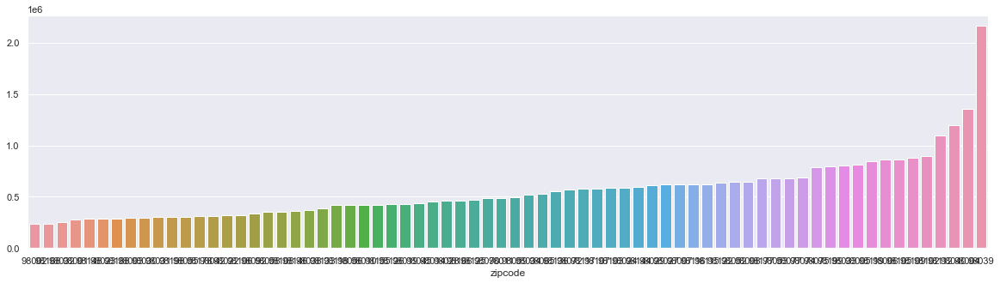

In [159]:
zip_code=df.groupby('zipcode').price.mean().sort_values()

plt.figure(figsize=(20,5))
sns.set_theme()
sns.barplot(x=zip_code.index,y=zip_code.values,order=zip_code.index);

* fiyat 1 milyonun üstündeyse 2,
* 360K'nin altinda ise 0,
* Bu ikisinin arasinda ise 1 olarak etiketleyelim

In [161]:
def cls(x):
    if df[df.zipcode==x].price.mean()>=1e+06:
        return 2
    elif df[df.zipcode==x].price.mean()>360000:
        return 1
    else:
        return 0

df['zip'] = df.zipcode.apply(cls)

In [162]:
df.drop(['date','zipcode'],axis=1,inplace=True)
df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'month', 'year', 'zip'],
      dtype='object')

**yr_renovated and sqft_basement**

In [166]:
df[['yr_renovated','sqft_basement']]

,yr_renovated,sqft_basement
0,0,0
1,1991,400
2,0,0
3,0,910
4,0,0
...,...,...
21592,0,0
21593,0,0
21594,0,0
21595,0,0


In [163]:
# could make sense due to scaling, higher should correlate to more value
df['yr_renovated'].value_counts()

0       20683
2014       91
2013       37
2003       36
2000       35
        ...  
1934        1
1959        1
1951        1
1948        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

In [34]:
df['sqft_basement'].value_counts()

0       13110
600       221
700       218
500       214
800       206
        ...  
792         1
2590        1
935         1
2390        1
248         1
Name: sqft_basement, Length: 306, dtype: int64

* 'yr_renovated' ve 'sqft_basement' bool degere dondurmektense boyle birakmak daha dogru.
* Cunku verimizi scale ederek (0,1) arasina sikistiracagiz, boylece olcek farkini ortadan kaldiracagiz. 

## Scaling and Train Test Split

In [171]:
X = df.drop('price',axis=1)
y = df['price']

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [172]:
scaler = MinMaxScaler()
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [173]:
X_train.shape, X_test.shape

((15117, 20), (6480, 20))

## Creating a Model

In [44]:
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Dense, Activation
# from tensorflow.keras.optimizers import Adam

In [174]:
model = Sequential()

model.add(Dense(19,activation='relu'))
model.add(Dense(19,activation='relu'))
model.add(Dense(19,activation='relu'))
model.add(Dense(19,activation='relu'))
model.add(Dense(1))

model.compile(optimizer='adam',loss='mse')

## Training the Model

In [175]:
model.fit(x=X_train,
          y=y_train.values,
          validation_data=(X_test,y_test.values),
          batch_size=128,epochs=400)

Epoch 1/400
119/119 [==============================] - 1s 7ms/step - loss: 417124553523.2000 - val_loss: 419980312576.0000
Epoch 2/400
119/119 [==============================] - 0s 2ms/step - loss: 436155172181.3333 - val_loss: 411261435904.0000
Epoch 3/400
119/119 [==============================] - 0s 2ms/step - loss: 414765434743.4667 - val_loss: 335526232064.0000
Epoch 4/400
119/119 [==============================] - 0s 2ms/step - loss: 298664013960.5333 - val_loss: 152337514496.0000
Epoch 5/400
119/119 [==============================] - 0s 2ms/step - loss: 122008332492.8000 - val_loss: 93742194688.0000
Epoch 6/400
119/119 [==============================] - 0s 2ms/step - loss: 101622365388.8000 - val_loss: 91744059392.0000
Epoch 7/400
119/119 [==============================] - 0s 2ms/step - loss: 86681923310.9333 - val_loss: 89833734144.0000
Epoch 8/400
119/119 [==============================] - 0s 2ms/step - loss: 90176618427.7333 - val_loss: 87815569408.0000
Epoch 9/400
119/119 [=

119/119 [==============================] - 0s 1ms/step - loss: 27129317367.4667 - val_loss: 28034865152.0000
Epoch 69/400
119/119 [==============================] - 0s 1ms/step - loss: 27467897804.8000 - val_loss: 27971301376.0000
Epoch 70/400
119/119 [==============================] - 0s 1ms/step - loss: 27579309943.4667 - val_loss: 27783931904.0000
Epoch 71/400
119/119 [==============================] - 0s 1ms/step - loss: 27350033544.5333 - val_loss: 27689588736.0000
Epoch 72/400
119/119 [==============================] - 0s 1ms/step - loss: 26198279202.1333 - val_loss: 27655438336.0000
Epoch 73/400
119/119 [==============================] - 0s 1ms/step - loss: 26330635605.3333 - val_loss: 27329165312.0000
Epoch 74/400
119/119 [==============================] - 0s 1ms/step - loss: 26454309461.3333 - val_loss: 27177342976.0000
Epoch 75/400
119/119 [==============================] - 0s 1ms/step - loss: 28537692774.4000 - val_loss: 27153231872.0000
Epoch 76/400
119/119 [===============

Epoch 135/400
119/119 [==============================] - 0s 1ms/step - loss: 22896003737.6000 - val_loss: 23692699648.0000
Epoch 136/400
119/119 [==============================] - 0s 2ms/step - loss: 22293350237.8667 - val_loss: 23644829696.0000
Epoch 137/400
119/119 [==============================] - 0s 1ms/step - loss: 23528026197.3333 - val_loss: 23761899520.0000
Epoch 138/400
119/119 [==============================] - 0s 2ms/step - loss: 25202436778.6667 - val_loss: 23620495360.0000
Epoch 139/400
119/119 [==============================] - 0s 2ms/step - loss: 23056686984.5333 - val_loss: 23561680896.0000
Epoch 140/400
119/119 [==============================] - 0s 2ms/step - loss: 24306684586.6667 - val_loss: 23534340096.0000
Epoch 141/400
119/119 [==============================] - 0s 2ms/step - loss: 24484127470.9333 - val_loss: 23728736256.0000
Epoch 142/400
119/119 [==============================] - 0s 2ms/step - loss: 22483809280.0000 - val_loss: 23547041792.0000
Epoch 143/400
11

119/119 [==============================] - 0s 2ms/step - loss: 23327655389.8667 - val_loss: 22349279232.0000
Epoch 202/400
119/119 [==============================] - 0s 2ms/step - loss: 23132380765.8667 - val_loss: 22301722624.0000
Epoch 203/400
119/119 [==============================] - 0s 2ms/step - loss: 23158719419.7333 - val_loss: 22300565504.0000
Epoch 204/400
119/119 [==============================] - 0s 1ms/step - loss: 23652551048.5333 - val_loss: 22334621696.0000
Epoch 205/400
119/119 [==============================] - 0s 2ms/step - loss: 22482009881.6000 - val_loss: 22317813760.0000
Epoch 206/400
119/119 [==============================] - 0s 2ms/step - loss: 22181677892.2667 - val_loss: 22308771840.0000
Epoch 207/400
119/119 [==============================] - 0s 2ms/step - loss: 23853355042.1333 - val_loss: 22233149440.0000
Epoch 208/400
119/119 [==============================] - 0s 1ms/step - loss: 23551715549.8667 - val_loss: 22234085376.0000
Epoch 209/400
119/119 [=======

119/119 [==============================] - 0s 1ms/step - loss: 21974397661.8667 - val_loss: 21544171520.0000
Epoch 268/400
119/119 [==============================] - 0s 1ms/step - loss: 22447666107.7333 - val_loss: 21546061824.0000
Epoch 269/400
119/119 [==============================] - 0s 1ms/step - loss: 20827552938.6667 - val_loss: 21531621376.0000
Epoch 270/400
119/119 [==============================] - 0s 1ms/step - loss: 21181769489.0667 - val_loss: 21537554432.0000
Epoch 271/400
119/119 [==============================] - 0s 1ms/step - loss: 21194256896.0000 - val_loss: 21526460416.0000
Epoch 272/400
119/119 [==============================] - 0s 1ms/step - loss: 22528078523.7333 - val_loss: 21528846336.0000
Epoch 273/400
119/119 [==============================] - 0s 1ms/step - loss: 20230127803.7333 - val_loss: 21498925056.0000
Epoch 274/400
119/119 [==============================] - 0s 1ms/step - loss: 22772054067.2000 - val_loss: 21581152256.0000
Epoch 275/400
119/119 [=======

119/119 [==============================] - 0s 1ms/step - loss: 21467204608.0000 - val_loss: 21033928704.0000
Epoch 334/400
119/119 [==============================] - 0s 1ms/step - loss: 22174352520.5333 - val_loss: 20961017856.0000
Epoch 335/400
119/119 [==============================] - 0s 1ms/step - loss: 20371105655.4667 - val_loss: 21051752448.0000
Epoch 336/400
119/119 [==============================] - 0s 1ms/step - loss: 20510552439.4667 - val_loss: 20924887040.0000
Epoch 337/400
119/119 [==============================] - 0s 1ms/step - loss: 22045412283.7333 - val_loss: 20930244608.0000
Epoch 338/400
119/119 [==============================] - 0s 1ms/step - loss: 20914298197.3333 - val_loss: 20912586752.0000
Epoch 339/400
119/119 [==============================] - 0s 1ms/step - loss: 21407044795.7333 - val_loss: 20913354752.0000
Epoch 340/400
119/119 [==============================] - 0s 1ms/step - loss: 19870740915.2000 - val_loss: 20930940928.0000
Epoch 341/400
119/119 [=======

119/119 [==============================] - 0s 1ms/step - loss: 20577413009.0667 - val_loss: 20533518336.0000
Epoch 400/400
119/119 [==============================] - 0s 2ms/step - loss: 20106808311.4667 - val_loss: 20477509632.0000


# Evaluation
https://scikit-learn.org/stable/modules/model_evaluation.html#regression-metrics

In [190]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 19)                399       
_________________________________________________________________
dense_1 (Dense)              (None, 19)                380       
_________________________________________________________________
dense_2 (Dense)              (None, 19)                380       
_________________________________________________________________
dense_3 (Dense)              (None, 19)                380       
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 20        
Total params: 1,559
Trainable params: 1,559
Non-trainable params: 0
_________________________________________________________________


In [206]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

TypeError: no numeric data to plot

In [205]:
# Alternative with seaborn
# loss = model.history.history['loss']
# sns.lineplot(x=range(len(loss)),y=loss)
# plt.title("Training Loss per Epoch");

**Loss-Epoch Graph**

ZeroDivisionError: integer division or modulo by zero

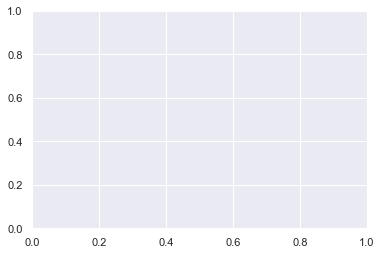

In [207]:
fig, ax= plt.subplots()
ax.plot(loss_df)
ax.set_xlabel("epoch")
ax.set_ylabel("loss")
ax.set_title("loss - epoch graph")
ax.set_xlim([0,250]) # focusing on the given x values
ax.set_ylim([0,50]) # focusing on the given y values

In [ ]:
loss_df.loss.idxmin() 

# Evaluation Metrics

In [209]:
def eval_metrics(actual, pred):
    rmse = np.sqrt(mean_squared_error(actual, pred))
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    r2score = r2_score(actual, pred)
    print(f"R2 Score: {r2score}",
          f"Mean Absolute Error(MAE): {mae}",
          f"Mean Square Error(MSE): {mse}",
          f"Root Mean Square Error(RMSE): {rmse}",sep="\n")

In [210]:
#Training Data
y_train_pred = model.predict(X_train)
eval_metrics(y_train, y_train_pred)

R2 Score: 0.8476039464065658
Mean Absolute Error(MAE): 89771.02612861864
Mean Square Error(MSE): 20718600062.67053
Root Mean Square Error(RMSE): 143939.57087149637


In [211]:
# Test Data
y_pred = model.predict(X_test)
eval_metrics(y_test, y_pred)

R2 Score: 0.845567551054035
Mean Absolute Error(MAE): 89546.16691547912
Mean Square Error(MSE): 20477505818.971676
Root Mean Square Error(RMSE): 143099.63598476298


In [212]:
# Alternatively
training_score = model.evaluate(X_train,y_train,verbose=0)
test_score = model.evaluate(X_test,y_test,verbose=0)

print('training_msa:',training_score,
      '\ntest_msa:', test_score,sep='')

training_msa:20718598144.0
test_msa:20477509632.0


* In the above code, model.evaluate() gives MSE Score. Because, as a loss parametre, we use loss="mse" in model.compile() when we create the model.

**Let's compare to the real test labels!**

In [213]:
y_test.shape, y_pred.shape

((6480,), (6480, 1))

In [214]:
my_dict={"Actual":y_test, 
         "Pred":y_pred.reshape(6480,)}

compare=pd.DataFrame(my_dict)
compare.sample(5)

,Actual,Pred
19884,288790.000,316867.188
12970,490000.000,491387.812
19445,550000.000,785344.938
15325,425000.000,466545.750
12088,1600000.000,1017976.125


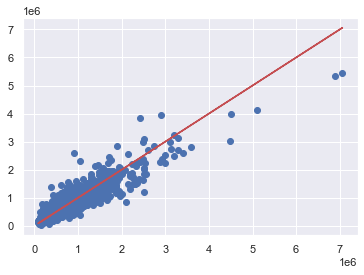

In [221]:
plt.scatter(compare.Actual,compare.Pred)
plt.plot(compare.Actual,compare.Actual,'r');

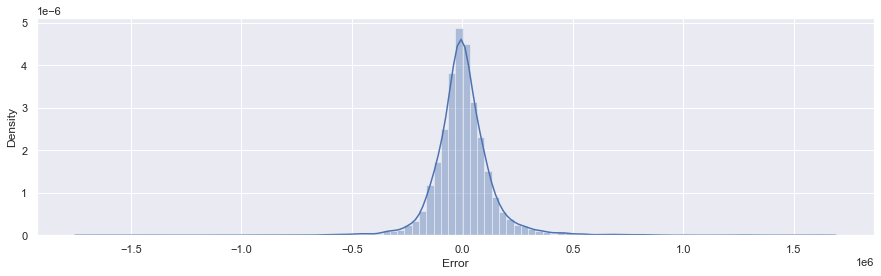

In [227]:
plt.figure(figsize=(15,4))
compare['Error'] = compare['Actual'] - compare['Pred']
sns.distplot(compare['Error'],kde=True,bins=100);

## Predicting on brand new data

In [231]:
df.shape

(21597, 21)

In [239]:
df.iloc[0]

price           221900.000
bedrooms             3.000
bathrooms            1.000
sqft_living       1180.000
sqft_lot          5650.000
floors               1.000
waterfront           0.000
view                 0.000
condition            3.000
grade                7.000
sqft_above        1180.000
sqft_basement        0.000
yr_built          1955.000
yr_renovated         0.000
lat                 47.511
long              -122.257
sqft_living15     1340.000
sqft_lot15        5650.000
month               10.000
year              2014.000
zip                  0.000
Name: 0, dtype: float64

In [243]:
single_house = df.drop('price',axis=1).iloc[0]
single_house = scaler.transform(single_house.values.reshape(-1, 20))

In [250]:
print('Prediction Price: ', *model.predict(single_house)[0], 
      '\nActual Price: ',df.price.iloc[0], sep='')

Prediction Price: 252035.9
Actual Price: 221900.0


## Saving and Loading a Model
* We dont use pickle for Keras when we save a DL Model.
* Keras has a model loading station itself.
* Google Colab te calisirken model kaydedildiginde sol tarafta gorunur. Model oradan drag&drop ile drive da istenen klasore tasinabilir.
* Lets remember how to save a ML Model

    import pickle
    
    pickle.dump(svm,open("svm","wb"))
    
    svm_model = pickle.load(open("svm","rb"))

In [251]:
model.save('my_model.h5')  # creates a HDF5 file 'my_model.h5'
later_model = load_model('my_model.h5')

In [252]:
later_model.predict(single_house)

array([[252035.9]], dtype=float32)